#Image Style Transfer Using CNN (CVPR 2016)
## For Style Transfer
(출처 : 나동빈 유튜브 https://www.youtube.com/watch?v=va3e2c4uKJk&t=35s)

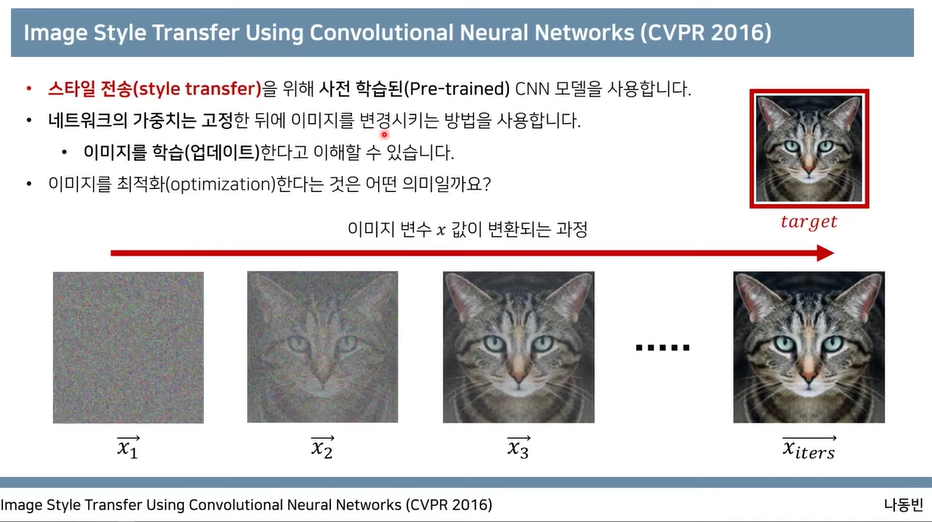

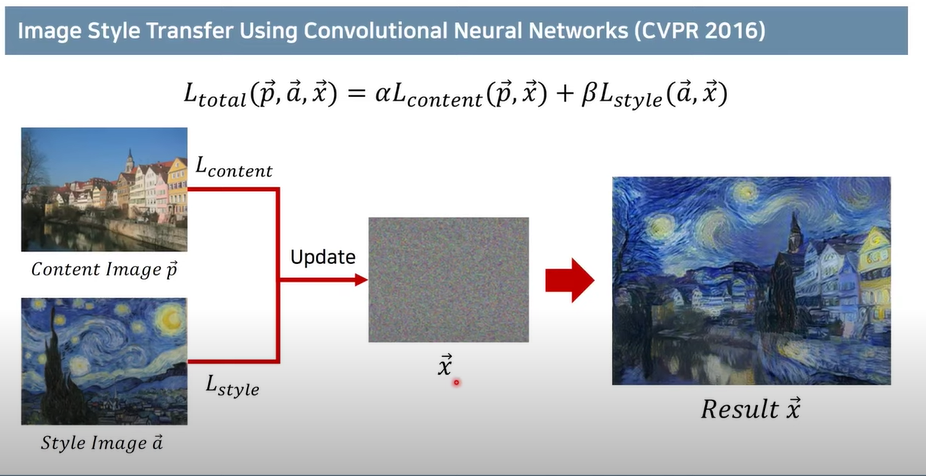

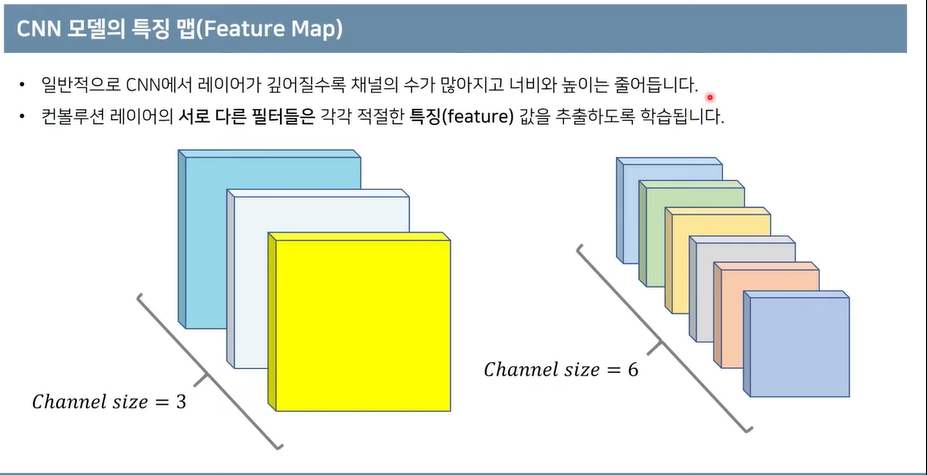

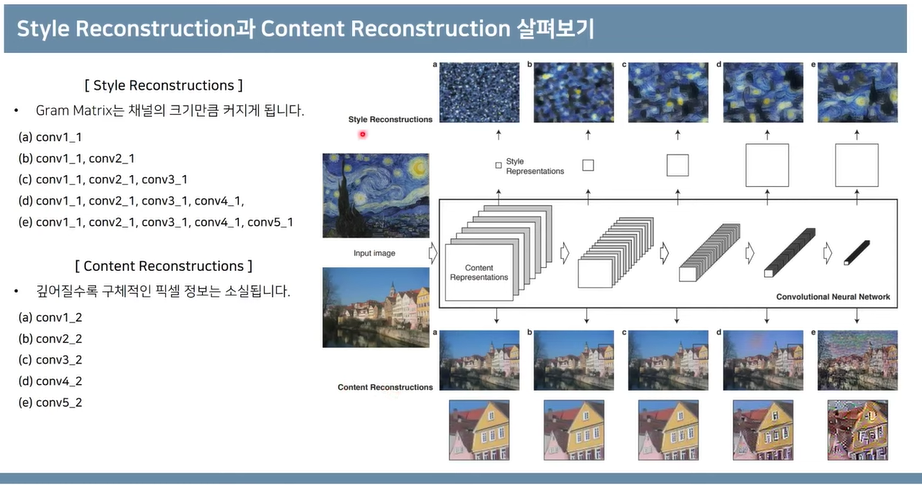

# 실습 코드 
- https://github.com/ndb796/Deep-Learning-Paper-Review-and-Practice/blob/master/code_practices/Style_Transfer_Tutorial.ipynb


#Style Transfer Tutorial
- 원본 논문: Image Style Transfer Using Convolutional Neural Networks (CVPR 2016)
- 딥러닝을 활용한 스타일 전송(style transfer) 방법을 처음으로 제안한 논문입니다.
-- 이미지 자체를 업데이트하는 이미지 최적화(optimization) 기법 유형에 해당합니다.
- 소스코드를 실행하기 전에 [런타임] - [런타임 유형 변경] - [GPU]로 설정되어 있는지 확인합니다.
- 논문에서 제시한 파라미터를 완전히 동일하게 따르지는 않으며 핵심 아이디어를 이해하는 목적에 적합한 코드입니다.

In [1]:
# 필요한 PyTorch 라이브러리 불러오기
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision.transforms as transforms
import torchvision.models as models

import PIL
import matplotlib.pyplot as plt

import copy

In [2]:
# GPU 장치 사용 설정
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [3]:
# 이미지를 불러와 다운받아 텐서(Tensor) 객체로 변환하는 함수
def image_loader(img_path, imsize):
    loader = transforms.Compose([
        transforms.Resize(imsize), # 이미지의 크기를 변경
        transforms.ToTensor() # torch.Tensor 형식으로 변경 [0, 255] → [0, 1]
    ])
    image = PIL.Image.open(img_path)
    # 네트워크 입력에 들어갈 이미지에 배치 목적의 차원(dimension) 추가
    image = loader(image).unsqueeze(0)
    return image.to(device, torch.float) # GPU로 올리기


# torch.Tensor 형태의 이미지를 화면에 출력하는 함수
def imshow(tensor):
    # matplotlib는 CPU 기반이므로 CPU로 옮기기
    image = tensor.cpu().clone()
    # torch.Tensor에서 사용되는 배치 목적의 차원(dimension) 제거
    image = image.squeeze(0)
    # PIL 객체로 변경 
    image = transforms.ToPILImage()(image)
    # 이미지를 화면에 출력(matplotlib는 [0, 1] 사이의 값이라고 해도 정상적으로 처리)
    plt.imshow(image)
    plt.show()

In [4]:
# 저장소의 소스코드를 다운로드하여 실습용 이미지 준비하기
!git clone https://github.com/ndb796/Deep-Learning-Paper-Review-and-Practice
%cd Deep-Learning-Paper-Review-and-Practice

Cloning into 'Deep-Learning-Paper-Review-and-Practice'...
remote: Enumerating objects: 17, done.
remote: Counting objects: 100% (17/17), done.
remote: Compressing objects: 100% (17/17), done.
remote: Total 278 (delta 4), reused 0 (delta 0), pack-reused 261
Receiving objects: 100% (278/278), 26.64 MiB | 9.52 MiB/s, done.
Resolving deltas: 100% (84/84), done.
/content/Deep-Learning-Paper-Review-and-Practice


##Image Reconstruction 실습하기
- 이미지를 최적화(optimization)한다는 것은 특정 손실 값을 낮추는 방향으로 이미지를 업데이트하는 것을 의미합니다.
- MSE 손실(loss)을 이용해 임의의 노이즈(noise)를 특정한 이미지로 변환해 봅시다

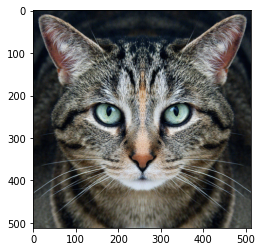

In [5]:
# 목표 이미지(target image) 불러오기
img_path = './code_practices/images/cat.jpg'
target_image = image_loader(img_path, (512, 512))
imshow(target_image)

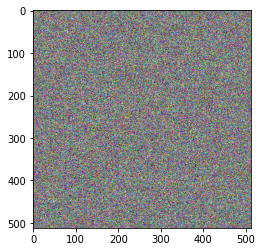

In [6]:
# 동일한 크기의 노이즈 이미지 준비하기
noise = torch.empty_like(target_image).uniform_(0, 1).to(device)
imshow(noise)

[ Start ]


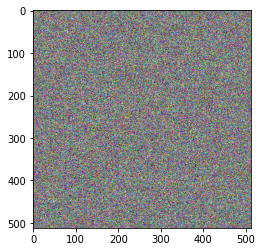

[ Step: 10 ]
Loss: 0.10433769226074219


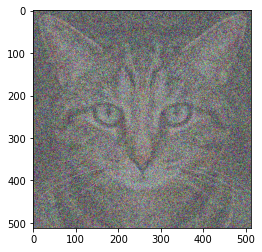

[ Step: 20 ]
Loss: 0.062329016625881195


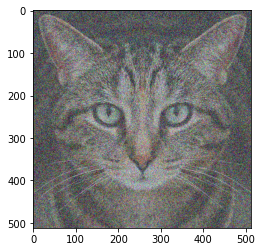

[ Step: 30 ]
Loss: 0.03723396733403206


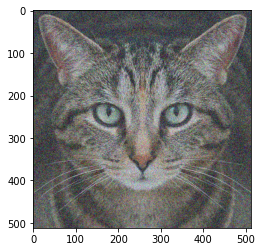

[ Step: 40 ]
Loss: 0.022242745384573936


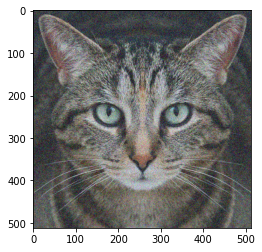

[ Step: 50 ]
Loss: 0.013287319801747799


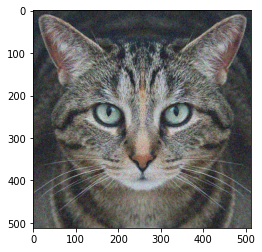

[ Step: 60 ]
Loss: 0.007937549613416195


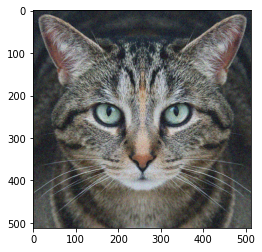

[ Step: 70 ]
Loss: 0.004741715267300606


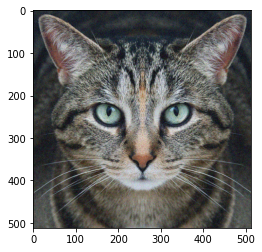

[ Step: 80 ]
Loss: 0.0028325950261205435


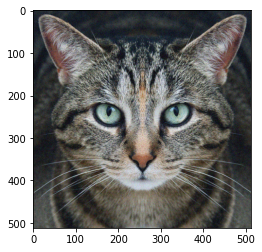

[ Step: 90 ]
Loss: 0.001692129299044609


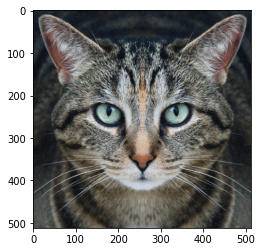

[ Step: 100 ]
Loss: 0.0010108404094353318


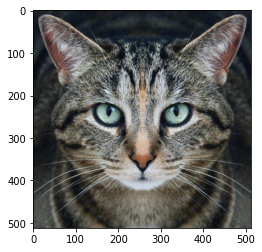

In [7]:
loss = nn.MSELoss() # 손실(loss) 함수 설정
iters = 100 # 반복(iteration) 횟수 설정
lr = 1e4

print("[ Start ]")
imshow(noise)

for i in range(iters):
    # required_grad 속성의 값을 True로 설정하여 해당 torch.Tensor의 연산을 추적
    noise.requires_grad = True

    # 손실 함수에 대하여 미분하여 기울기(gradient) 계산
    output = loss(noise, target_image)
    output.backward()

    # 계산된 기울기(gradient)를 이용하여 손실 함수가 감소하는 방향으로 업데이트
    gradient = lr * noise.grad
    # 결과적으로 노이즈(perturbation)의 각 픽셀의 값이 [-eps, eps] 사이의 값이 되도록 자르기
    noise = torch.clamp(noise - gradient, min=0, max=1).detach_() # 연산을 추적하는 것을 중단하기 위해 detach() 호출

    if (i + 1) % 10 == 0:
        print(f'[ Step: {i + 1} ]')
        print(f'Loss: {output}')
        imshow(noise)


# 실습을 위한 이미지 불러오기
- 빈센트 반 고흐의 그림과 건물 사진을 불러옵니다.

[ Content Image ]


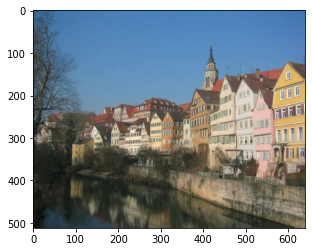

[ Style Image ]


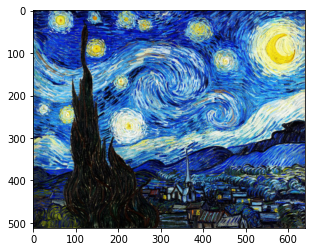

In [8]:
# 콘텐츠(Content) 이미지와 스타일(Style) 이미지를 모두 준비합니다.
content_img = image_loader('./code_practices/images/content_img_1.jpg', (512, 640))
style_img = image_loader('./code_practices/images/style_img_1.jpg', (512, 640))

print("[ Content Image ]")
imshow(content_img)
print("[ Style Image ]")
imshow(style_img)


#CNN 네트워크 불러오기
- 특징 추출기(feature extractor)로 VGG 네트워크를 사용합니다.

In [9]:
# 뉴럴 네트워크 모델을 불러옵니다.
cnn = models.vgg19(pretrained=True).features.to(device).eval()
print(cnn)

Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth



Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (17): ReLU(inplace=True)
  (18): MaxPo

In [10]:
# 입력 정규화(Normalization)를 위한 초기화
cnn_normalization_mean = torch.tensor([0.485, 0.456, 0.406]).to(device)
cnn_normalization_std = torch.tensor([0.229, 0.224, 0.225]).to(device)

class Normalization(nn.Module):
    def __init__(self, mean, std):
        super(Normalization, self).__init__()
        self.mean = mean.clone().view(-1, 1, 1)
        self.std = std.clone().view(-1, 1, 1)

    def forward(self, img):
        return (img - self.mean) / self.std


# Style Reconstruction 실습하기
- 임의의 노이즈(noise)가 특정한 이미지의 스타일을 가지도록 변환합니다.
- style_layers 리스트 변수의 값을 조절하여 어떤 레이어를 이용할지 설정할 수 있습니다.

In [11]:

def gram_matrix(input):
    # a는 배치 크기, b는 특징 맵의 개수, (c, d)는 특징 맵의 차원을 의미
    a, b, c, d = input.size()
    # 논문에서는 i = 특징 맵의 개수, j = 각 위치(position)
    features = input.view(a * b, c * d)
    # 행렬 곱으로 한 번에 Gram 내적 계산 가능
    G = torch.mm(features, features.t())
    # Normalize 목적으로 값 나누기
    return G.div(a * b * c * d)


# 스타일 손실(style loss) 계산을 위한 클래스 정의
class StyleLoss(nn.Module):
    def __init__(self, target_feature):
        super(StyleLoss, self).__init__()
        self.target = gram_matrix(target_feature).detach()

    def forward(self, input):
        G = gram_matrix(input)
        self.loss = F.mse_loss(G, self.target)
        return input

In [12]:
style_layers = ['conv_1', 'conv_2', 'conv_3', 'conv_4', 'conv_5']

# 스타일 손실(style loss)을 계산하는 함수
def get_style_losses(cnn, style_img, noise_image):
    cnn = copy.deepcopy(cnn)
    normalization = Normalization(cnn_normalization_mean, cnn_normalization_std).to(device)
    style_losses = []
    
    # 가장 먼저 입력 이미지가 입력 정규화(input normalization)를 수행하도록
    model = nn.Sequential(normalization)

    # 현재 CNN 모델에 포함되어 있는 모든 레이어를 확인하며
    i = 0
    for layer in cnn.children():
        if isinstance(layer, nn.Conv2d):
            i += 1
            name = 'conv_{}'.format(i)
        elif isinstance(layer, nn.ReLU):
            name = 'relu_{}'.format(i)
            layer = nn.ReLU(inplace=False)
        elif isinstance(layer, nn.MaxPool2d):
            name = 'pool_{}'.format(i)
        elif isinstance(layer, nn.BatchNorm2d):
            name = 'bn_{}'.format(i)
        else:
            raise RuntimeError('Unrecognized layer: {}'.format(layer.__class__.__name__))

        model.add_module(name, layer)

        # 설정한 style layer까지의 결과를 이용해 style loss를 계산
        if name in style_layers:
            target_feature = model(style_img).detach()
            style_loss = StyleLoss(target_feature)
            model.add_module("style_loss_{}".format(i), style_loss)
            style_losses.append(style_loss)

    # 마지막 style loss 이후의 레이어는 사용하지 않도록
    for i in range(len(model) - 1, -1, -1):
        if isinstance(model[i], StyleLoss):
            break

    model = model[:(i + 1)]
    return model, style_losses

In [13]:
def style_reconstruction(cnn, style_img, input_img, iters):
    model, style_losses = get_style_losses(cnn, style_img, input_img)
    optimizer = optim.LBFGS([input_img.requires_grad_()])

    print("[ Start ]")
    imshow(input_img)

    # 하나의 값만 이용하기 위해 배열 형태로 사용
    run = [0]
    while run[0] <= iters:

        def closure():
            input_img.data.clamp_(0, 1)

            optimizer.zero_grad()
            model(input_img)
            style_score = 0

            for sl in style_losses:
                style_score += sl.loss

            style_score *= 1e6
            style_score.backward()

            run[0] += 1
            if run[0] % 50 == 0:
                print(f"[ Step: {run[0]} / Style loss: {style_score.item()}]")
                imshow(input_img)
            
            return style_score
        
        optimizer.step(closure)

    # 결과적으로 이미지의 각 픽셀의 값이 [0, 1] 사이의 값이 되도록 자르기
    input_img.data.clamp_(0, 1)

    return input_img

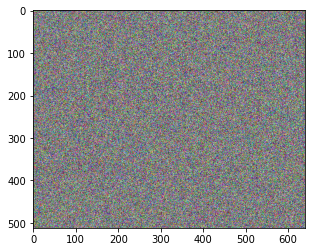

In [14]:
# 콘텐츠 이미지와 동일한 크기의 노이즈 이미지 준비하기
input_img = torch.empty_like(content_img).uniform_(0, 1).to(device)
imshow(input_img)

[ Start ]


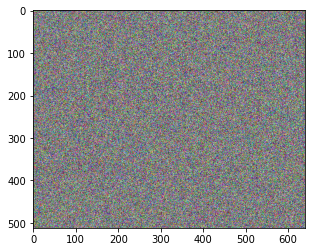

[ Step: 50 / Style loss: 452.47821044921875]


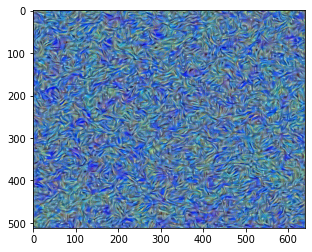

[ Step: 100 / Style loss: 112.73169708251953]


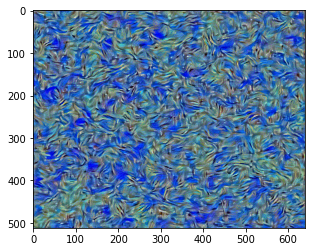

[ Step: 150 / Style loss: 50.212371826171875]


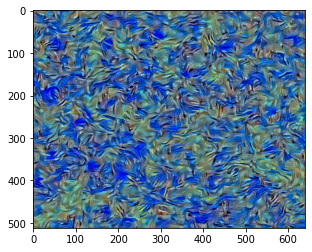

[ Step: 200 / Style loss: 35.289302825927734]


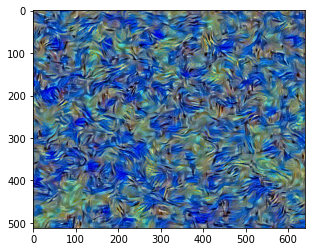

[ Step: 250 / Style loss: 28.1595401763916]


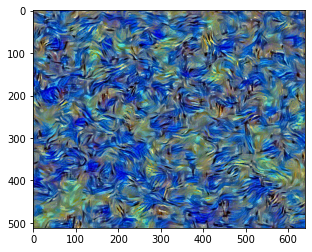

[ Step: 300 / Style loss: 22.99397087097168]


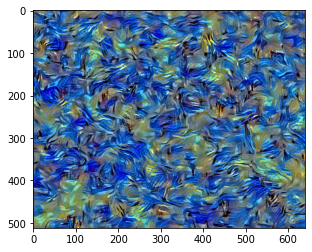

In [15]:
# style reconstruction 수행 - style만 유사해질 수 있도록 하는 과정
output = style_reconstruction(cnn, style_img=style_img, input_img=input_img, iters=300)

In [16]:
# 콘텐츠 손실(content loss) 계산을 위한 클래스 정의
class ContentLoss(nn.Module):
    def __init__(self, target,):
        super(ContentLoss, self).__init__()
        self.target = target.detach()

    def forward(self, input):
        self.loss = F.mse_loss(input, self.target)
        return input

In [17]:
content_layers = ['conv_4']

# 콘텐츠 손실(content loss)을 계산하는 함수
def get_content_losses(cnn, content_img, noise_image):
    cnn = copy.deepcopy(cnn)
    normalization = Normalization(cnn_normalization_mean, cnn_normalization_std).to(device)
    content_losses = []
    
    # 가장 먼저 입력 이미지가 입력 정규화(input normalization)를 수행하도록
    model = nn.Sequential(normalization)

    # 현재 CNN 모델에 포함되어 있는 모든 레이어를 확인하며
    i = 0
    for layer in cnn.children():
        if isinstance(layer, nn.Conv2d):
            i += 1
            name = 'conv_{}'.format(i)
        elif isinstance(layer, nn.ReLU):
            name = 'relu_{}'.format(i)
            layer = nn.ReLU(inplace=False)
        elif isinstance(layer, nn.MaxPool2d):
            name = 'pool_{}'.format(i)
        elif isinstance(layer, nn.BatchNorm2d):
            name = 'bn_{}'.format(i)
        else:
            raise RuntimeError('Unrecognized layer: {}'.format(layer.__class__.__name__))

        model.add_module(name, layer)

        # 설정한 content layer까지의 결과를 이용해 content loss를 계산
        if name in content_layers:
            target_feature = model(content_img).detach()
            content_loss = ContentLoss(target_feature)
            model.add_module("content_loss_{}".format(i), content_loss)
            content_losses.append(content_loss)

    # 마지막 content loss 이후의 레이어는 사용하지 않도록
    for i in range(len(model) - 1, -1, -1):
        if isinstance(model[i], ContentLoss):
            break

    model = model[:(i + 1)]
    return model, content_losses

In [18]:
def content_reconstruction(cnn, content_img, input_img, iters):
    model, content_losses = get_content_losses(cnn, content_img, input_img)
    optimizer = optim.LBFGS([input_img.requires_grad_()])

    print("[ Start ]")
    imshow(input_img)

    # 하나의 값만 이용하기 위해 배열 형태로 사용
    run = [0]
    while run[0] <= iters:

        def closure():
            input_img.data.clamp_(0, 1)

            optimizer.zero_grad()
            model(input_img)
            content_score = 0

            for cl in content_losses:
                content_score += cl.loss

            content_score.backward()

            run[0] += 1
            if run[0] % 50 == 0:
                print(f"[ Step: {run[0]} / Content loss: {content_score.item()}]")
                imshow(input_img)
            
            return content_score
        
        optimizer.step(closure)

    # 결과적으로 이미지의 각 픽셀의 값이 [0, 1] 사이의 값이 되도록 자르기
    input_img.data.clamp_(0, 1)

    return input_img

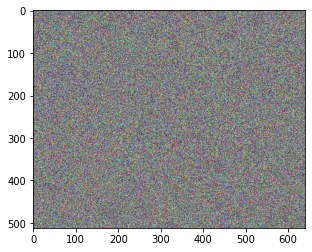

In [19]:
# 콘텐츠 이미지와 동일한 크기의 노이즈 이미지 준비하기
input_img = torch.empty_like(content_img).uniform_(0, 1).to(device)
imshow(input_img)

[ Start ]


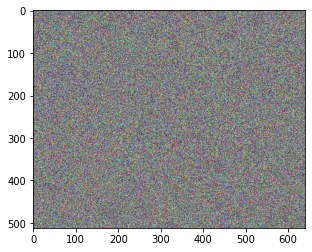

[ Step: 50 / Content loss: 0.7503032684326172]


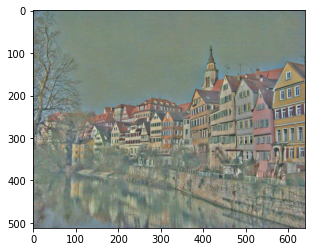

[ Step: 100 / Content loss: 0.37908628582954407]


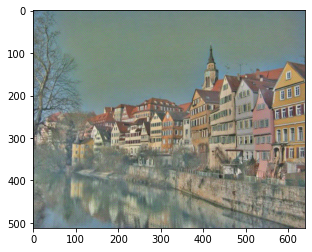

[ Step: 150 / Content loss: 0.24607224762439728]


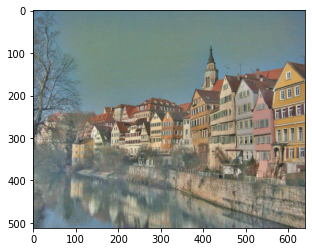

[ Step: 200 / Content loss: 0.17712347209453583]


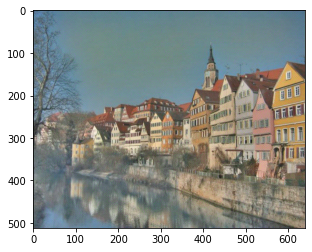

[ Step: 250 / Content loss: 0.13558952510356903]


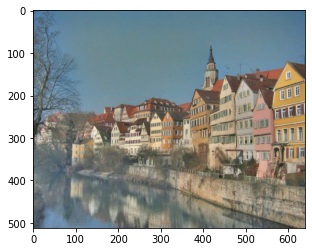

[ Step: 300 / Content loss: 0.10601713508367538]


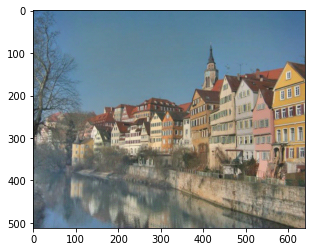

In [20]:
# content reconstruction 수행
output = content_reconstruction(cnn, content_img=content_img, input_img=input_img, iters=300)


#Style Transfer 실습하기 ①
- Content Loss와 Style Loss를 함께 이용하여 Style Transfer를 진행합니다.

In [21]:
content_layers = ['conv_4']
style_layers = ['conv_1', 'conv_3', 'conv_5', 'conv_7', 'conv_9']

# Style Transfer 손실(loss)을 계산하는 함수
def get_losses(cnn, content_img, style_img, noise_image):
    cnn = copy.deepcopy(cnn)
    normalization = Normalization(cnn_normalization_mean, cnn_normalization_std).to(device)
    content_losses = []
    style_losses = []
    
    # 가장 먼저 입력 이미지가 입력 정규화(input normalization)를 수행하도록
    model = nn.Sequential(normalization)

    # 현재 CNN 모델에 포함되어 있는 모든 레이어를 확인하며
    i = 0
    for layer in cnn.children():
        if isinstance(layer, nn.Conv2d):
            i += 1
            name = 'conv_{}'.format(i)
        elif isinstance(layer, nn.ReLU):
            name = 'relu_{}'.format(i)
            layer = nn.ReLU(inplace=False)
        elif isinstance(layer, nn.MaxPool2d):
            name = 'pool_{}'.format(i)
        elif isinstance(layer, nn.BatchNorm2d):
            name = 'bn_{}'.format(i)
        else:
            raise RuntimeError('Unrecognized layer: {}'.format(layer.__class__.__name__))

        model.add_module(name, layer)

        # 설정한 content layer까지의 결과를 이용해 content loss를 계산
        if name in content_layers:
            target_feature = model(content_img).detach()
            content_loss = ContentLoss(target_feature)
            model.add_module("content_loss_{}".format(i), content_loss)
            content_losses.append(content_loss)

        # 설정한 style layer까지의 결과를 이용해 style loss를 계산
        if name in style_layers:
            target_feature = model(style_img).detach()
            style_loss = StyleLoss(target_feature)
            model.add_module("style_loss_{}".format(i), style_loss)
            style_losses.append(style_loss)

    # 마지막 loss 이후의 레이어는 사용하지 않도록
    for i in range(len(model) - 1, -1, -1):
        if isinstance(model[i], ContentLoss) or isinstance(model[i], StyleLoss):
            break

    model = model[:(i + 1)]
    return model, content_losses, style_losses

In [22]:

def style_transfer(cnn, content_img, style_img, input_img, iters):
    model, content_losses, style_losses = get_losses(cnn, content_img, style_img, input_img)
    optimizer = optim.LBFGS([input_img.requires_grad_()])

    print("[ Start ]")
    imshow(input_img)

    # 하나의 값만 이용하기 위해 배열 형태로 사용
    run = [0]
    while run[0] <= iters:

        def closure():
            input_img.data.clamp_(0, 1)

            optimizer.zero_grad()
            model(input_img)
            content_score = 0
            style_score = 0

            for cl in content_losses:
                content_score += cl.loss
            for sl in style_losses:
                style_score += sl.loss

            style_score *= 1e5
            loss = content_score + style_score
            loss.backward()

            run[0] += 1
            if run[0] % 100 == 0:
                print(f"[ Step: {run[0]} / Content loss: {content_score.item()} / Style loss: {style_score.item()}]")
                imshow(input_img)
            
            return content_score + style_score
        
        optimizer.step(closure)

    # 결과적으로 이미지의 각 픽셀의 값이 [0, 1] 사이의 값이 되도록 자르기
    input_img.data.clamp_(0, 1)

    return input_img

[ Content Image ]


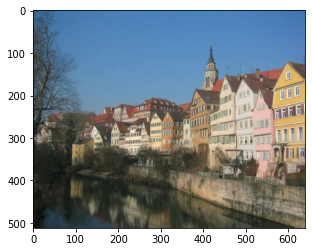

[ Style Image ]


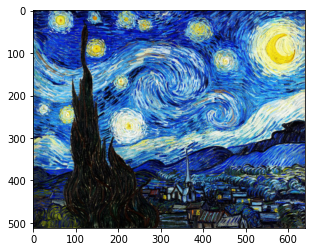

In [23]:

# 콘텐츠(Content) 이미지와 스타일(Style) 이미지를 모두 준비합니다.
content_img = image_loader('./code_practices/images/content_img_1.jpg', (512, 640))
style_img = image_loader('./code_practices/images/style_img_1.jpg', (512, 640))

print("[ Content Image ]")
imshow(content_img)
print("[ Style Image ]")
imshow(style_img)

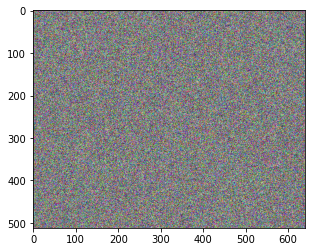

In [24]:
# 콘텐츠 이미지와 동일한 크기의 노이즈 이미지 준비하기
input_img = torch.empty_like(content_img).uniform_(0, 1).to(device)
imshow(input_img)

[ Start ]


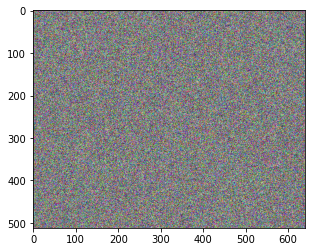

[ Step: 100 / Content loss: 44.300384521484375 / Style loss: 27.91497039794922]


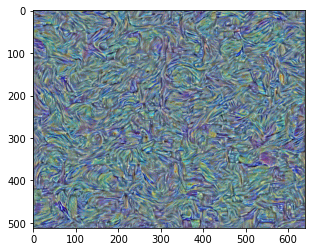

[ Step: 200 / Content loss: 36.76585006713867 / Style loss: 9.407997131347656]


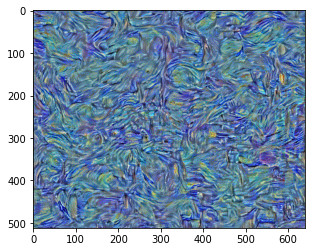

[ Step: 300 / Content loss: 31.3841495513916 / Style loss: 6.050053119659424]


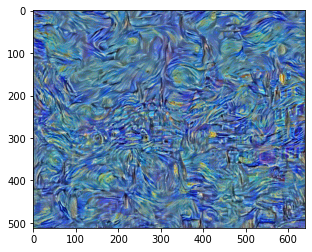

[ Step: 400 / Content loss: 27.74249839782715 / Style loss: 4.976469993591309]


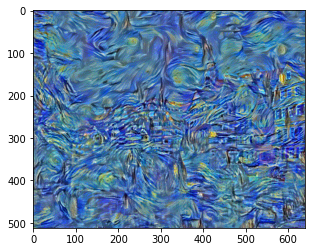

[ Step: 500 / Content loss: 25.61519432067871 / Style loss: 4.181837558746338]


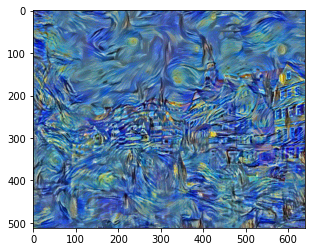

[ Step: 600 / Content loss: 23.99958610534668 / Style loss: 3.694711685180664]


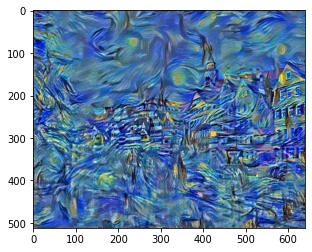

[ Step: 700 / Content loss: 22.865753173828125 / Style loss: 3.336625814437866]


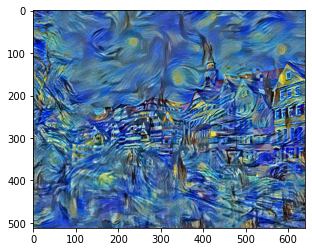

[ Step: 800 / Content loss: 21.86262321472168 / Style loss: 3.070542812347412]


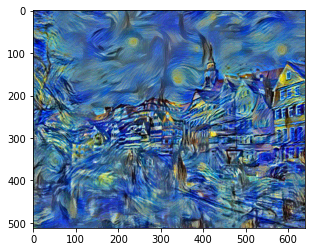

[ Step: 900 / Content loss: 21.16336441040039 / Style loss: 2.888981580734253]


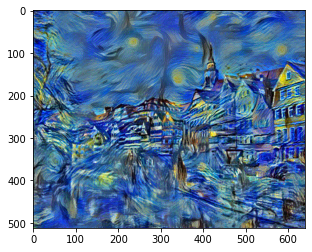

In [25]:
# style transfer 수행
output = style_transfer(cnn, content_img=content_img, style_img=style_img, input_img=input_img, iters=900)

In [26]:
from torchvision.utils import save_image

save_image(output.cpu().detach()[0], 'output_1.png')
print('이미지 파일 저장을 완료했습니다.')

이미지 파일 저장을 완료했습니다.


In [27]:
from google.colab import files

# 완성된 이미지를 다운로드합니다.
files.download('output_1.png')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

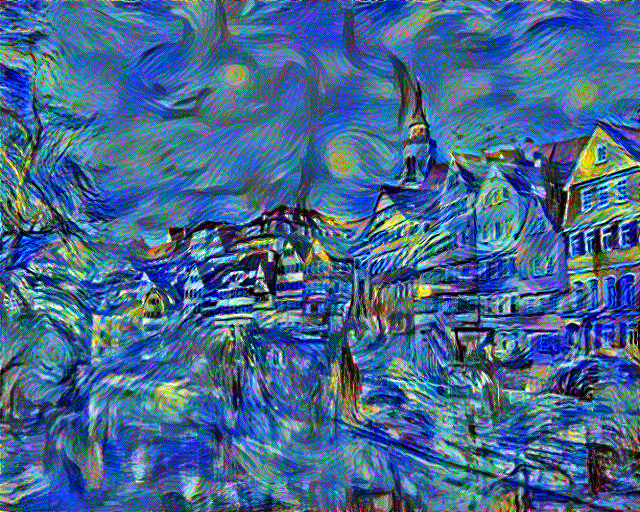

In [28]:
from IPython.display import Image

Image('output_1.png')


# Style Transfer 실습하기 ②

[ Content Image ]


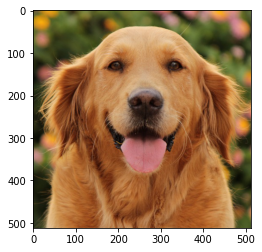

[ Style Image ]


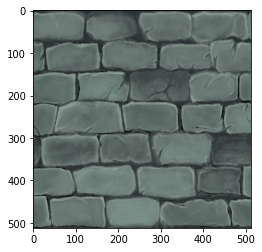

In [29]:
# 콘텐츠(Content) 이미지와 스타일(Style) 이미지를 모두 준비합니다.
content_img = image_loader('./code_practices/images/content_img_2.jpg', (512, 512))
style_img = image_loader('./code_practices/images/style_img_2.jpg', (512, 512))

print("[ Content Image ]")
imshow(content_img)
print("[ Style Image ]")
imshow(style_img)

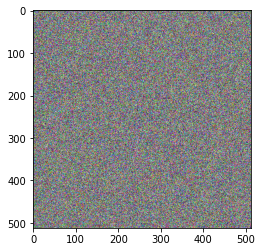

In [30]:
# 콘텐츠 이미지와 동일한 크기의 노이즈 이미지 준비하기
input_img = torch.empty_like(content_img).uniform_(0, 1).to(device)
imshow(input_img)

[ Start ]


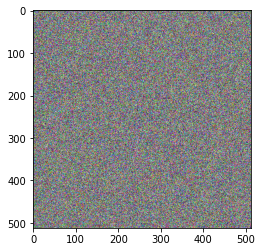

[ Step: 100 / Content loss: 12.067028999328613 / Style loss: 8.587953567504883]


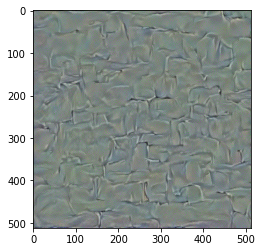

[ Step: 200 / Content loss: 8.571850776672363 / Style loss: 3.370274782180786]


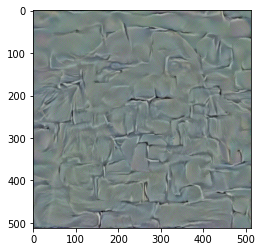

[ Step: 300 / Content loss: 6.7802534103393555 / Style loss: 2.217050075531006]


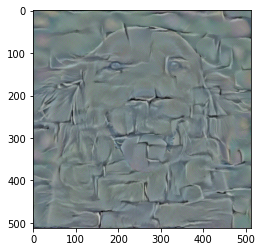

[ Step: 400 / Content loss: 5.723639488220215 / Style loss: 1.7094378471374512]


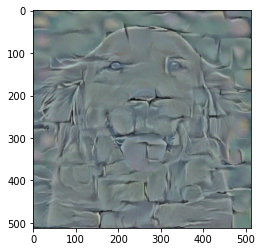

[ Step: 500 / Content loss: 5.090489387512207 / Style loss: 1.4151225090026855]


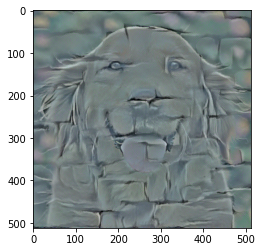

[ Step: 600 / Content loss: 4.657342433929443 / Style loss: 1.2077473402023315]


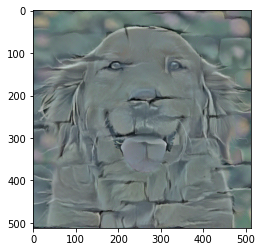

[ Step: 700 / Content loss: 4.359196186065674 / Style loss: 1.0631318092346191]


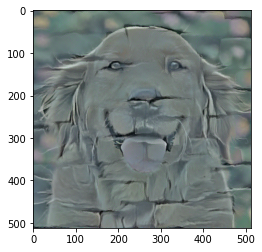

[ Step: 800 / Content loss: 4.147998809814453 / Style loss: 0.9607633948326111]


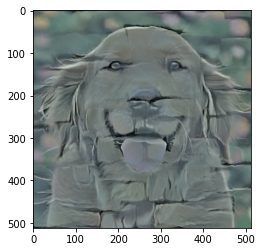

In [31]:
# style transfer 수행
output = style_transfer(cnn, content_img=content_img, style_img=style_img, input_img=input_img, iters=800)

In [32]:
from torchvision.utils import save_image

save_image(output.cpu().detach()[0], 'output_2.png')
print('이미지 파일 저장을 완료했습니다.')

이미지 파일 저장을 완료했습니다.


In [33]:
from google.colab import files

# 완성된 이미지를 다운로드합니다.
files.download('output_2.png')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

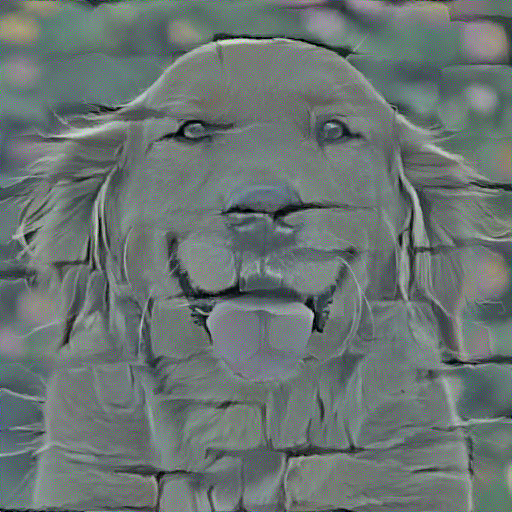

In [34]:
from IPython.display import Image

Image('output_2.png')